Total images: 9 | Batches: 3

>>> out_slurm_vits16-eomt


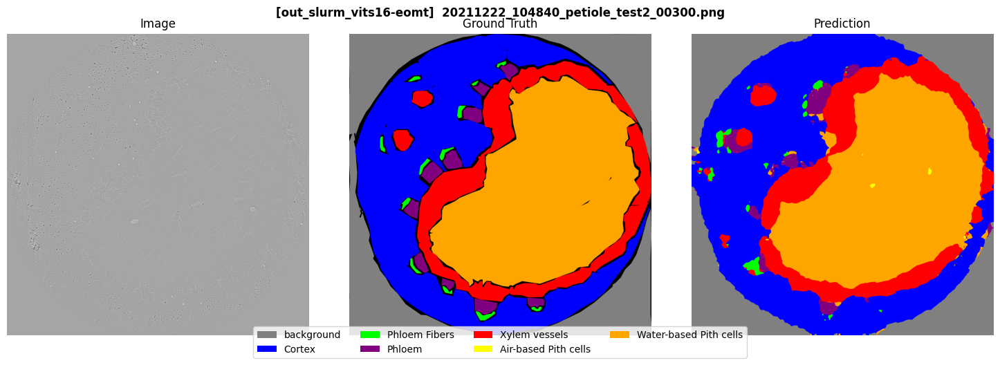

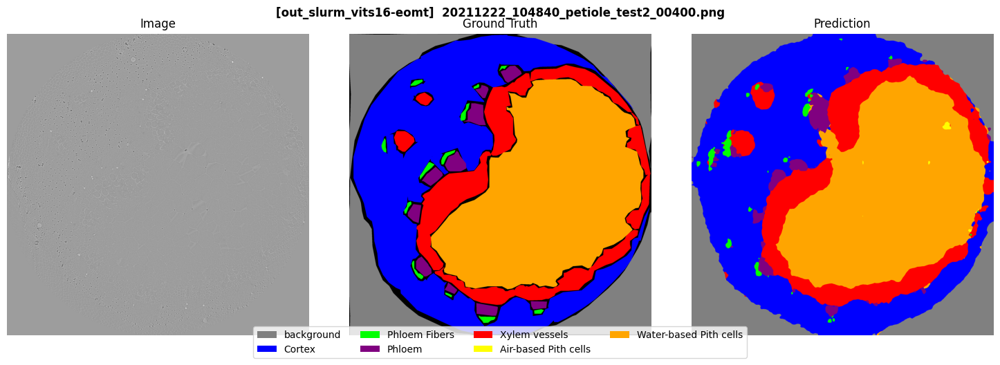

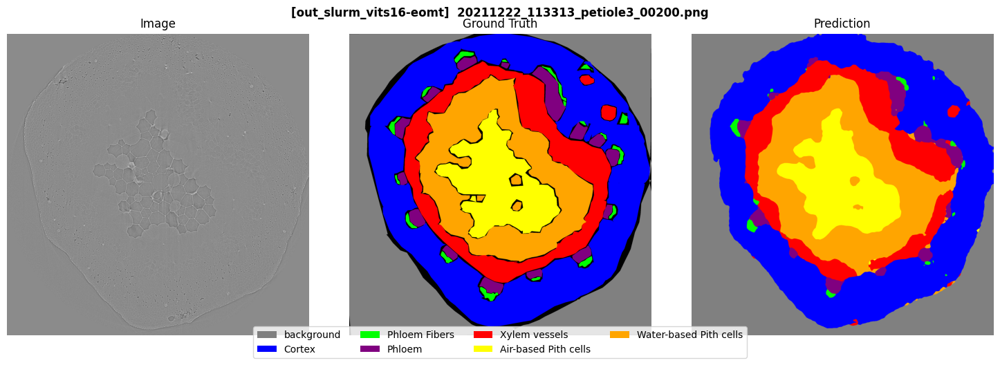

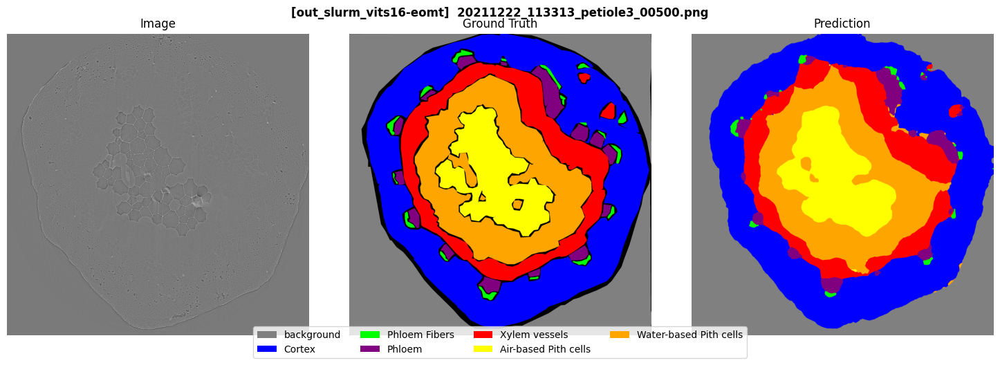

  Batch 1/3 done


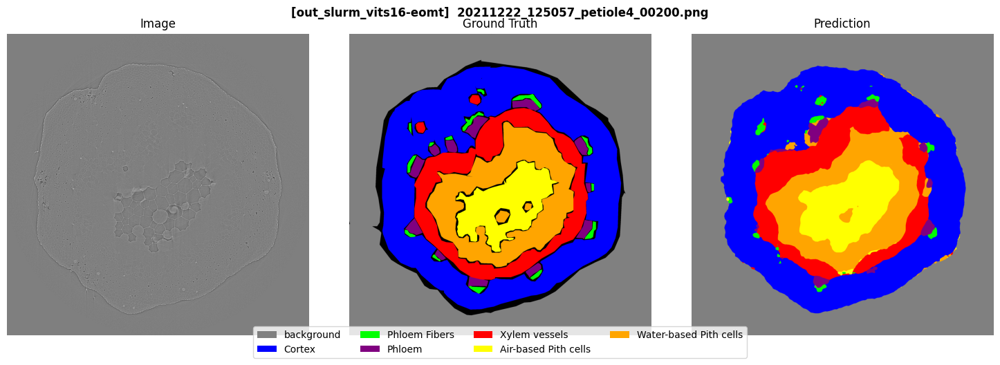

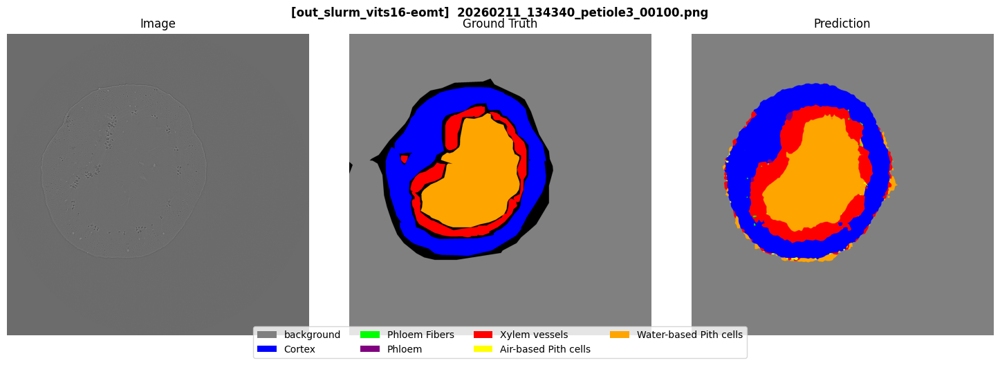

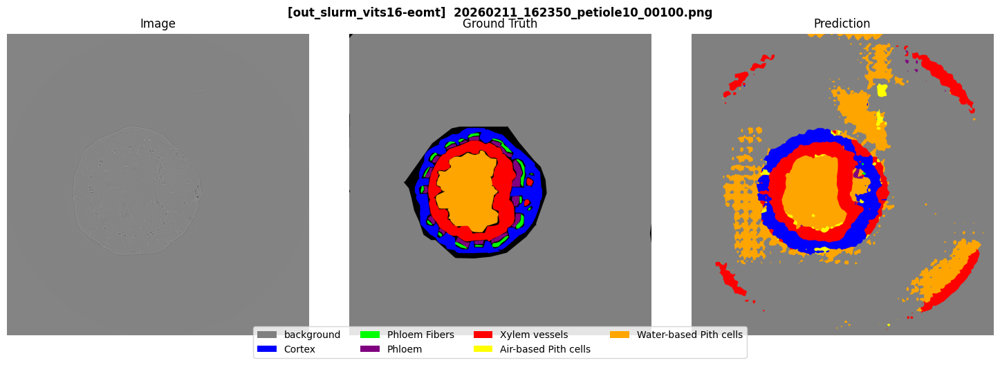

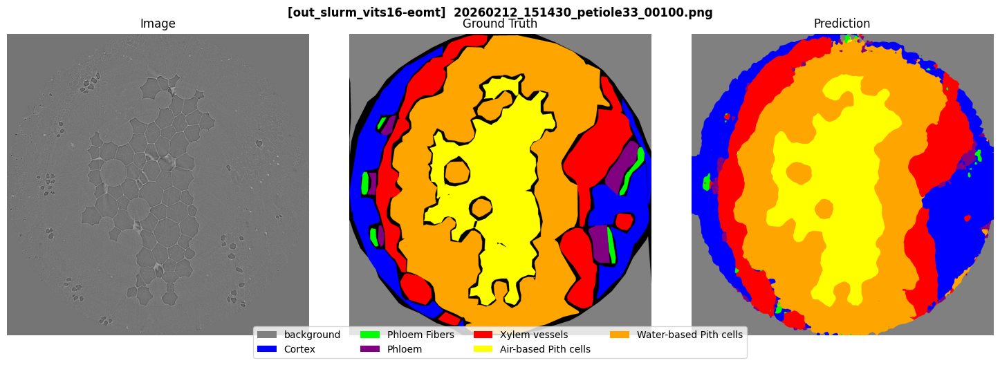

  Batch 2/3 done


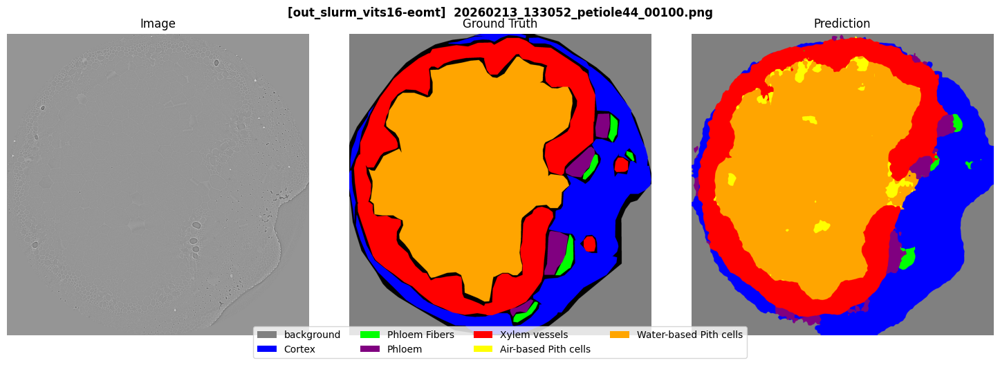

  Batch 3/3 done
<<< Done → dino_results/out_slurm_vits16-eomt

>>> out_slurm_vitb16-eomt


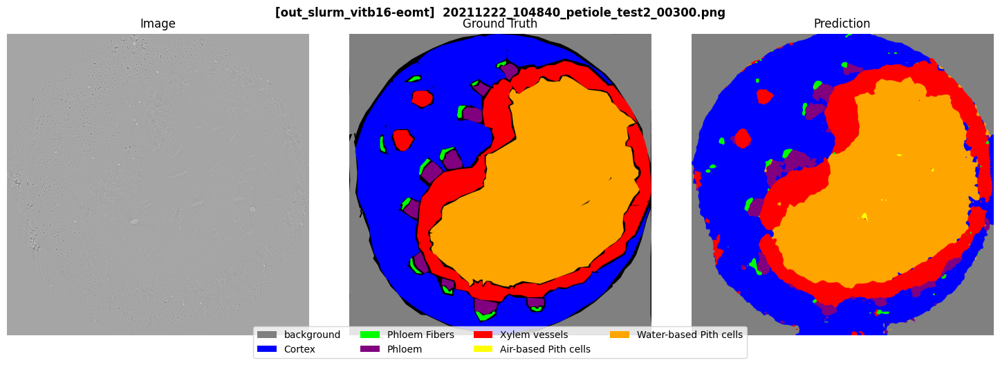

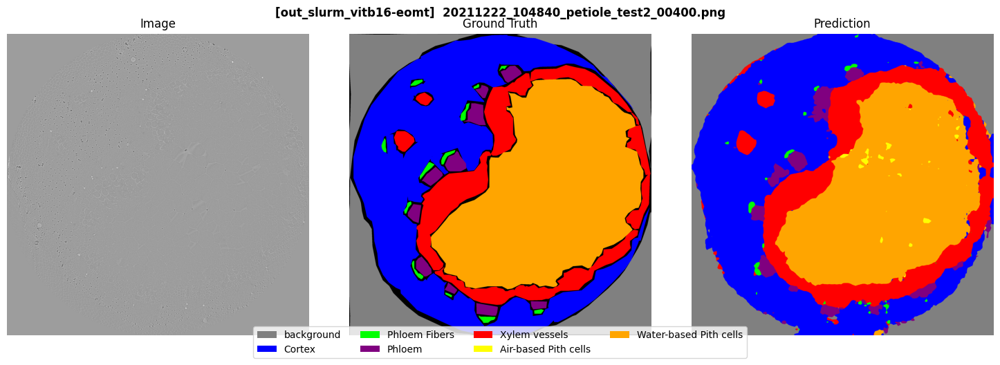

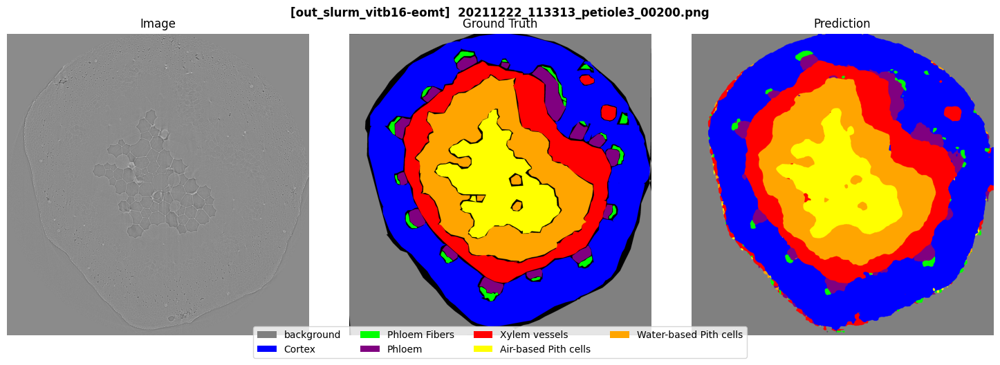

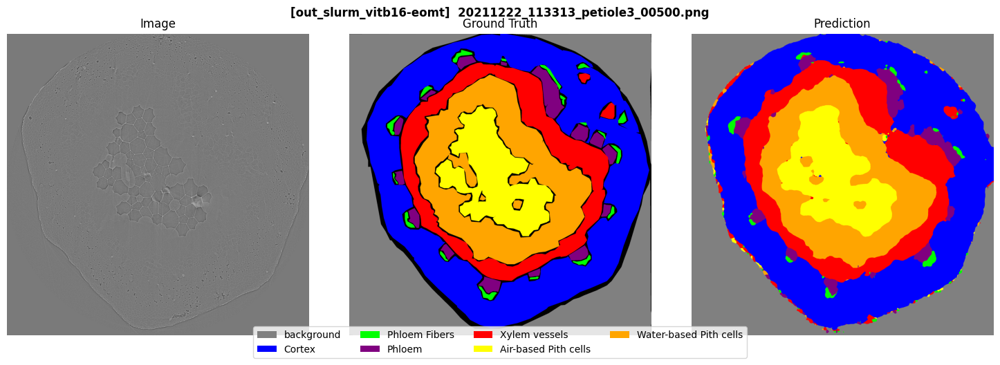

  Batch 1/3 done


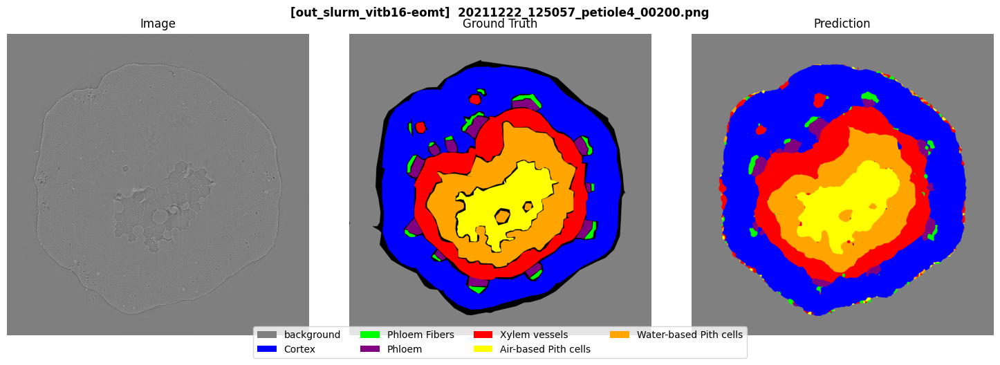

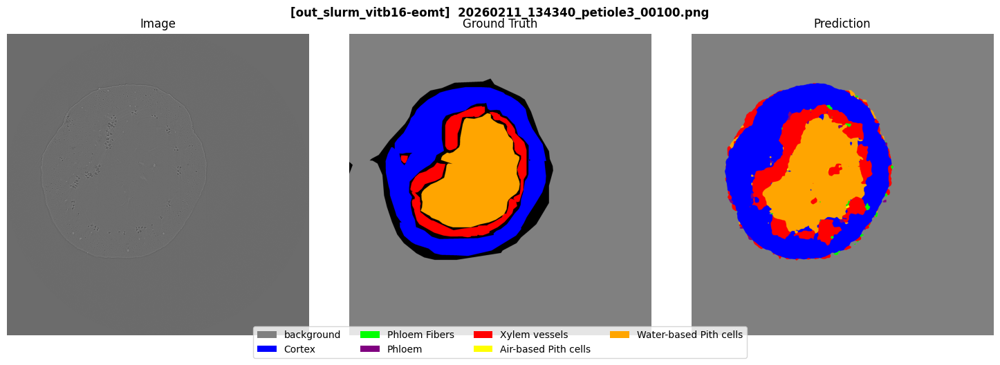

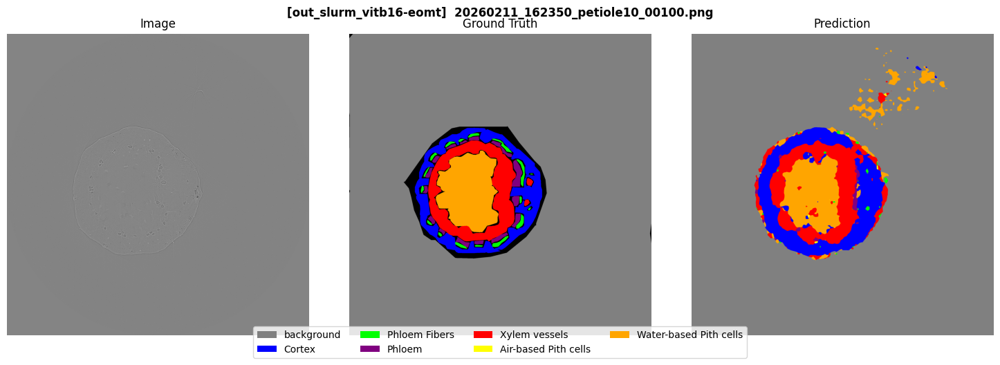

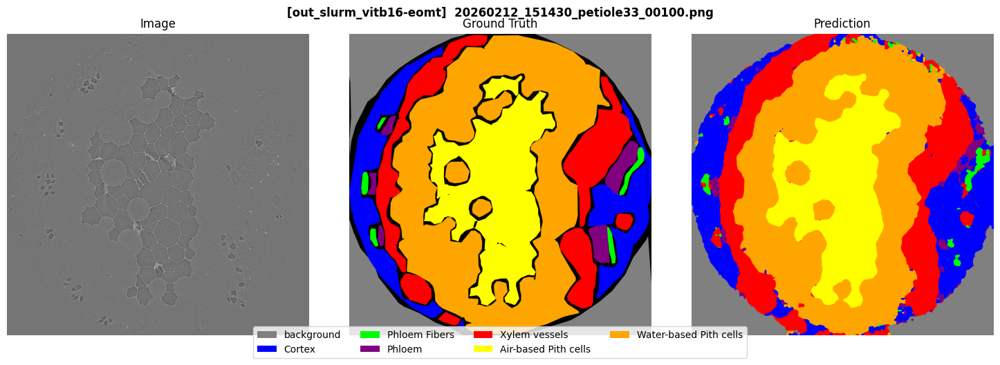

  Batch 2/3 done


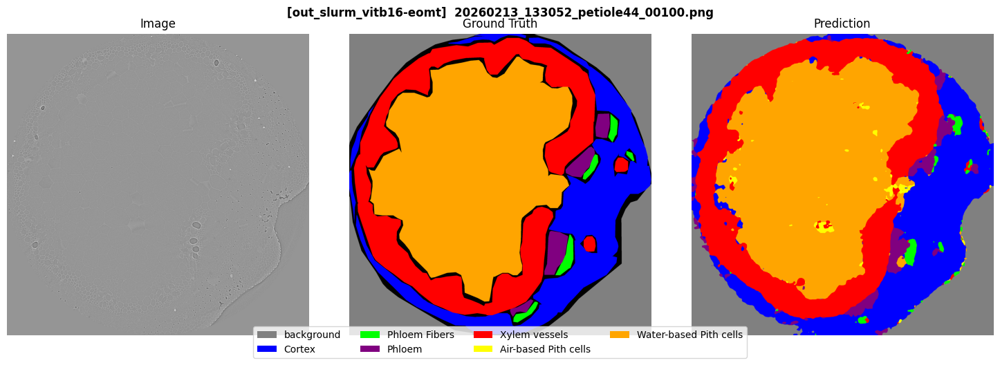

  Batch 3/3 done
<<< Done → dino_results/out_slurm_vitb16-eomt

>>> out_slurm_vitl16


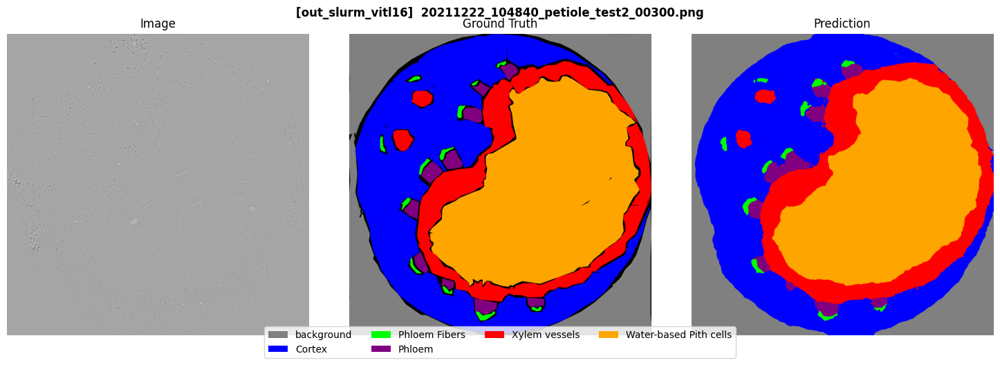

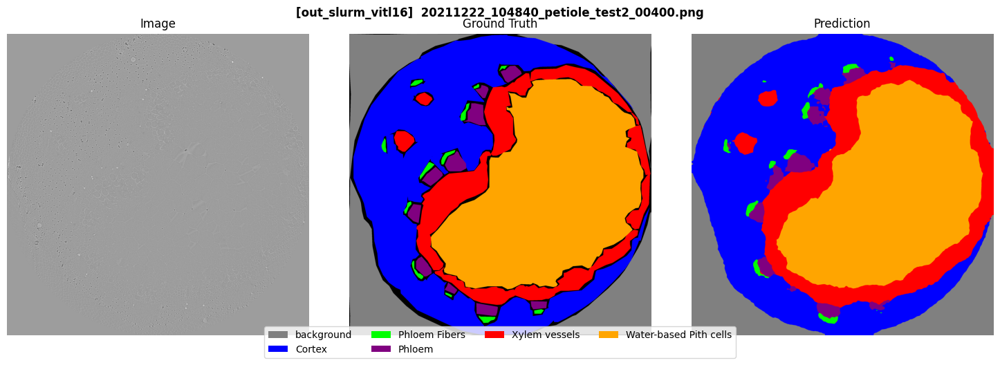

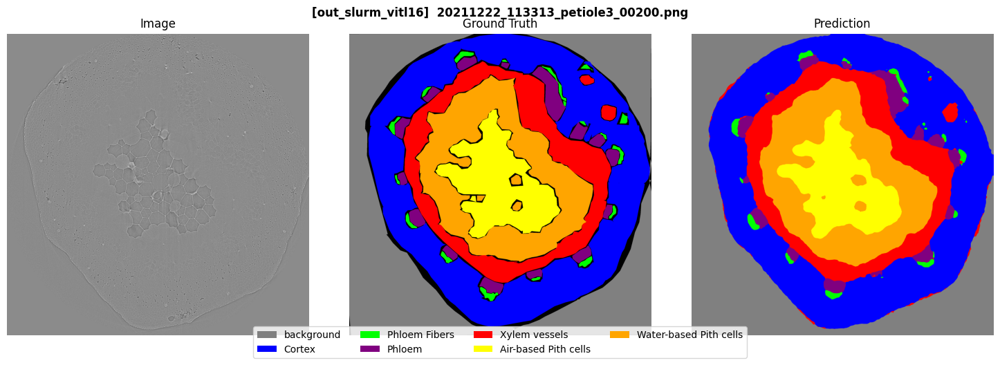

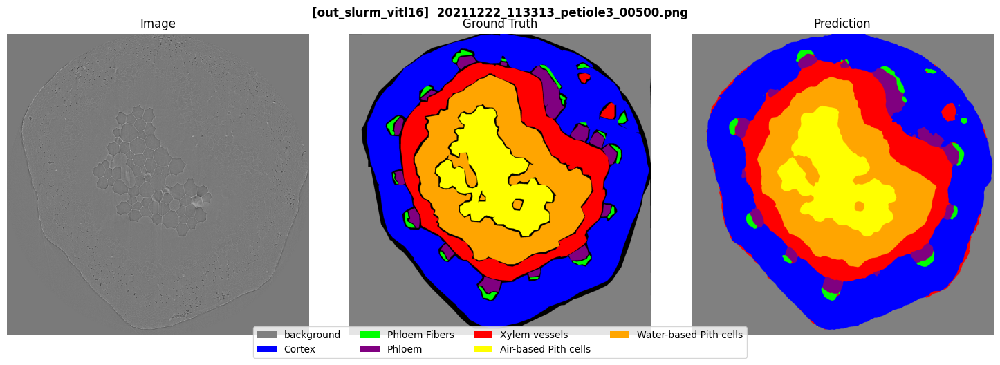

  Batch 1/3 done


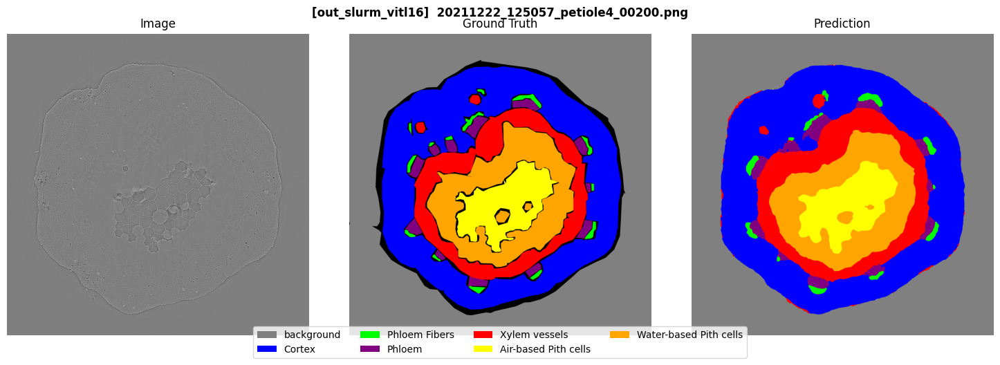

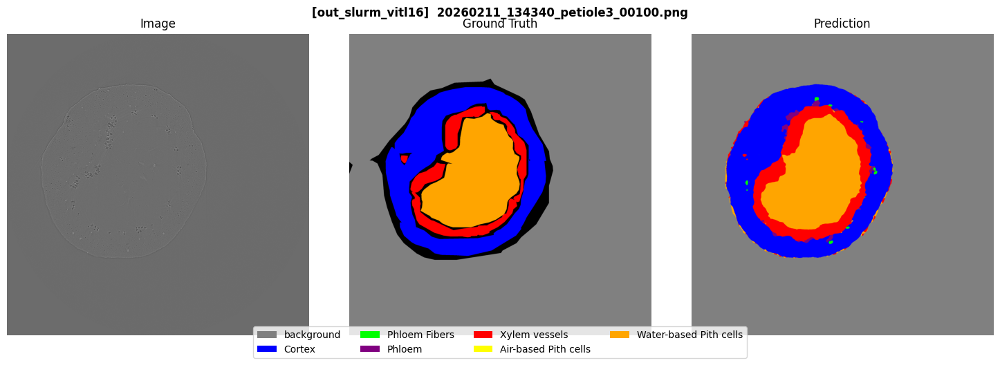

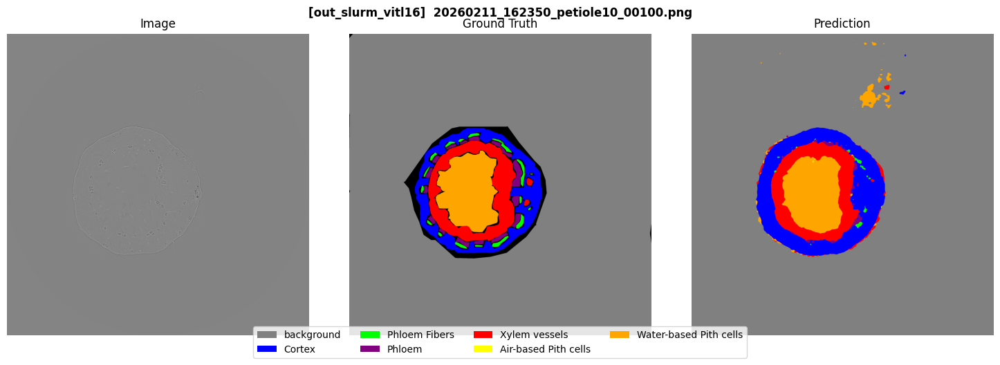

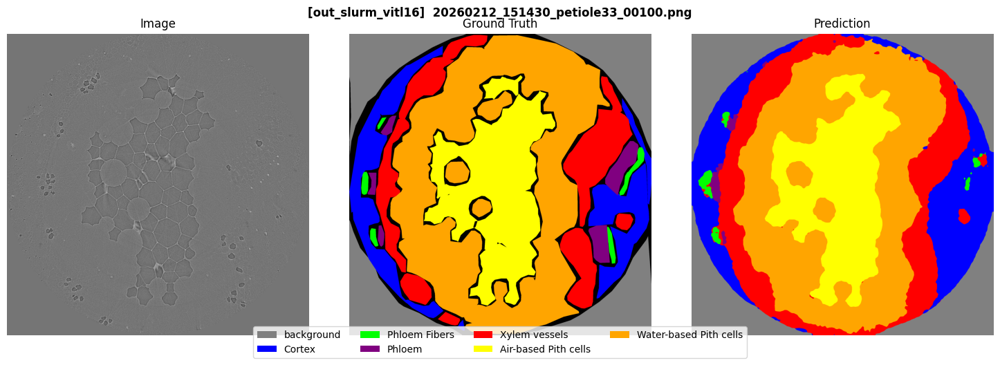

  Batch 2/3 done


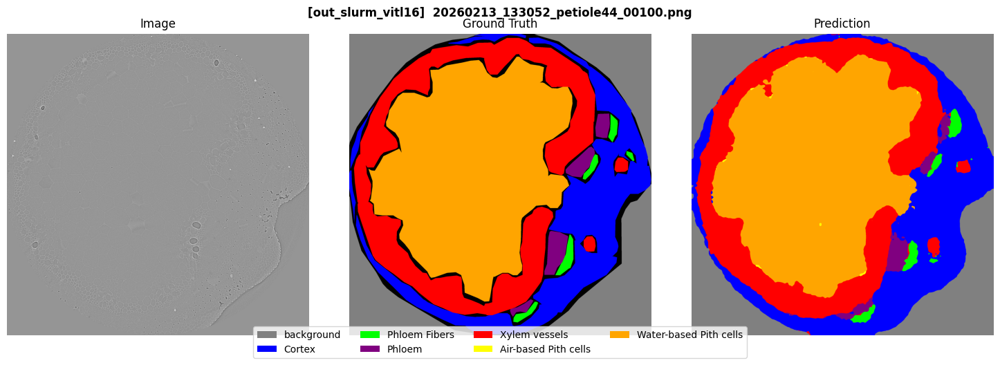

  Batch 3/3 done
<<< Done → dino_results/out_slurm_vitl16

>>> out_slurm_vitl16-eomt-cityscapes_new


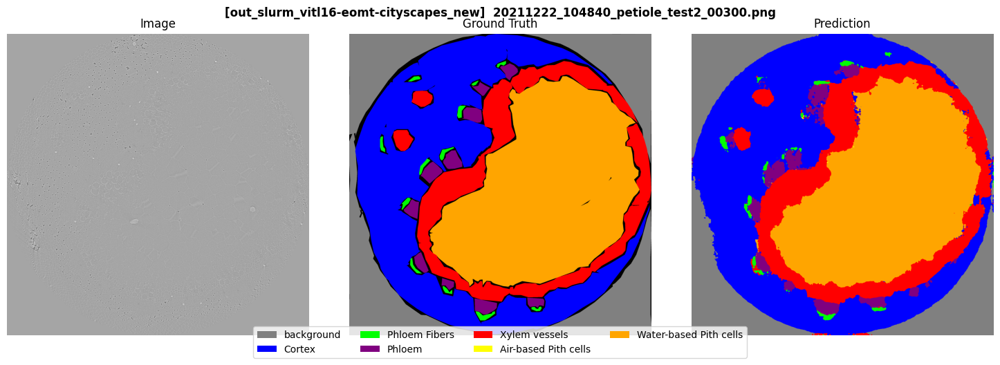

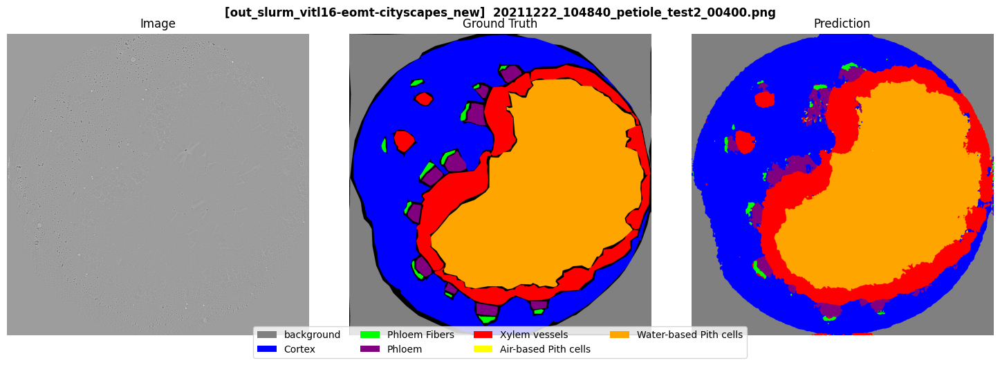

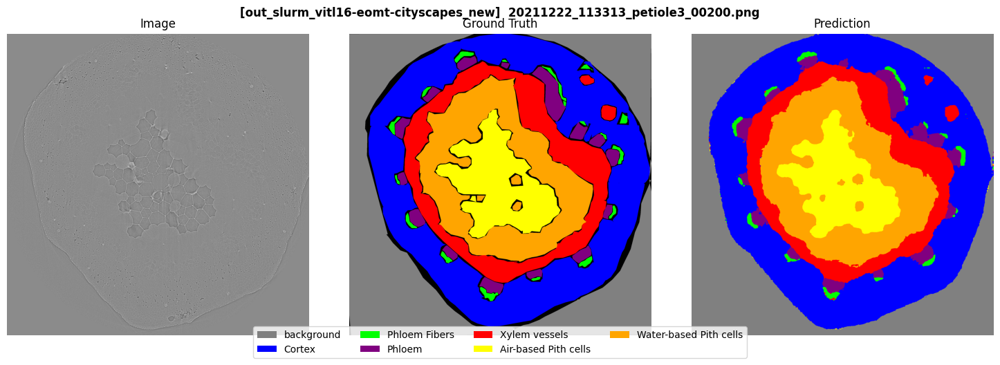

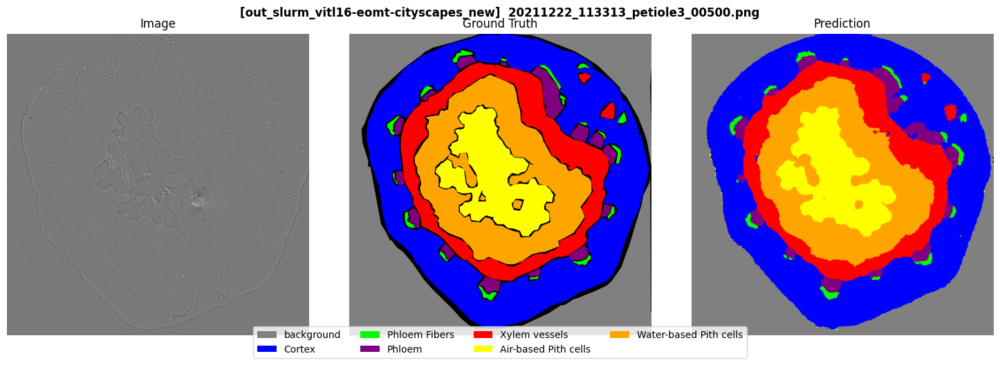

  Batch 1/3 done


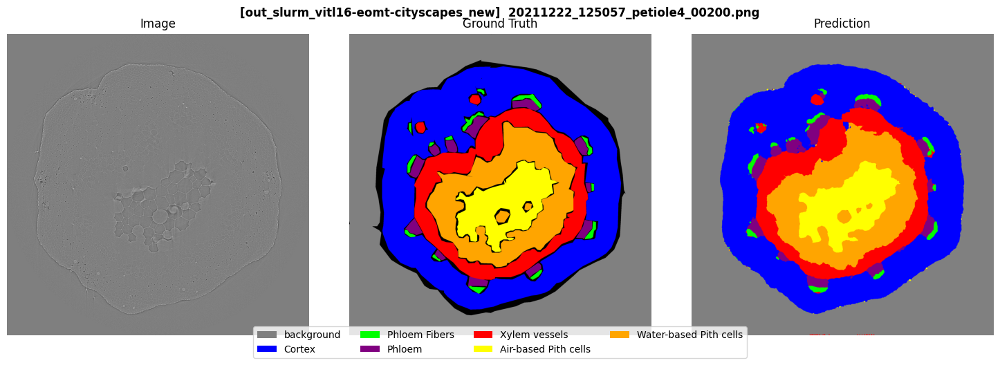

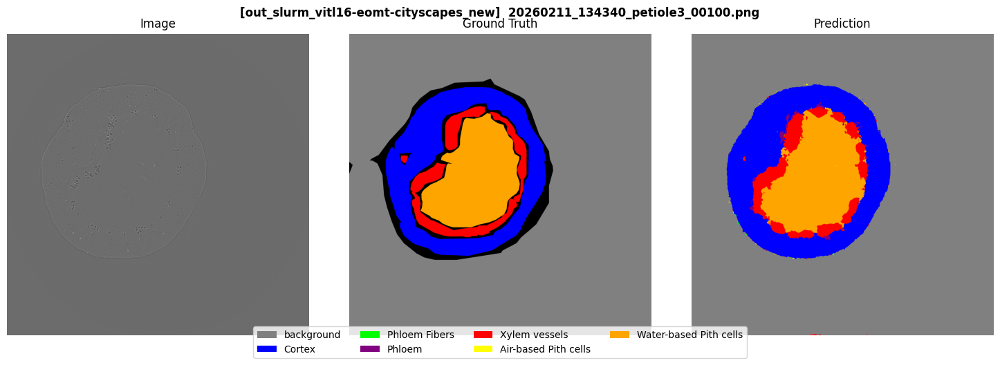

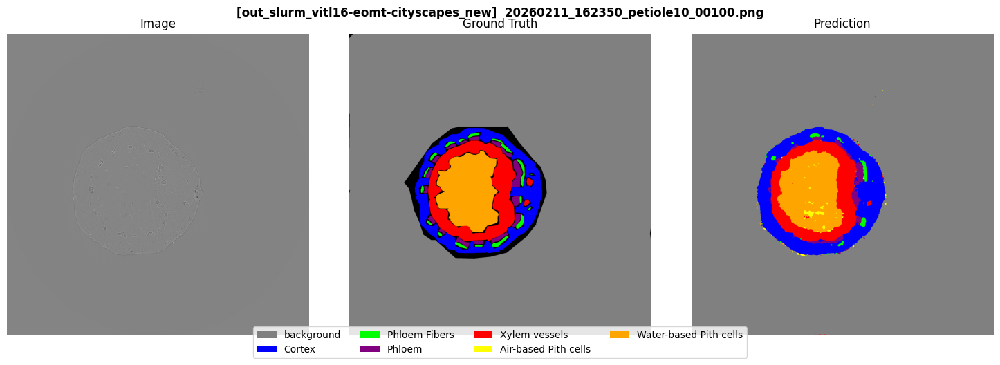

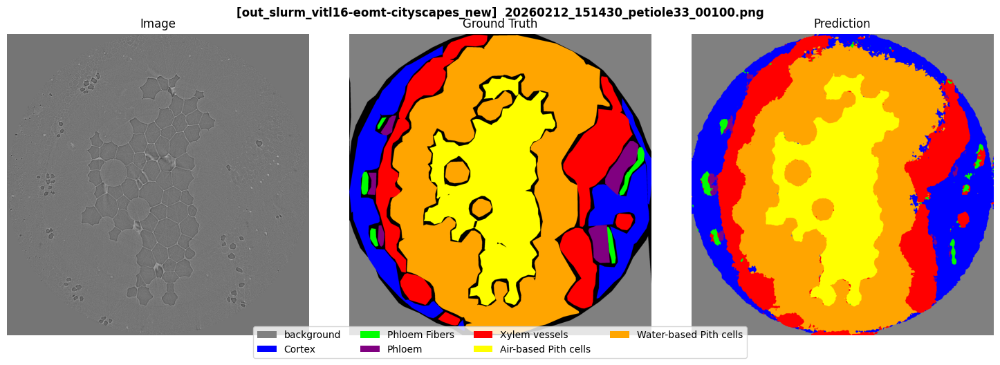

  Batch 2/3 done


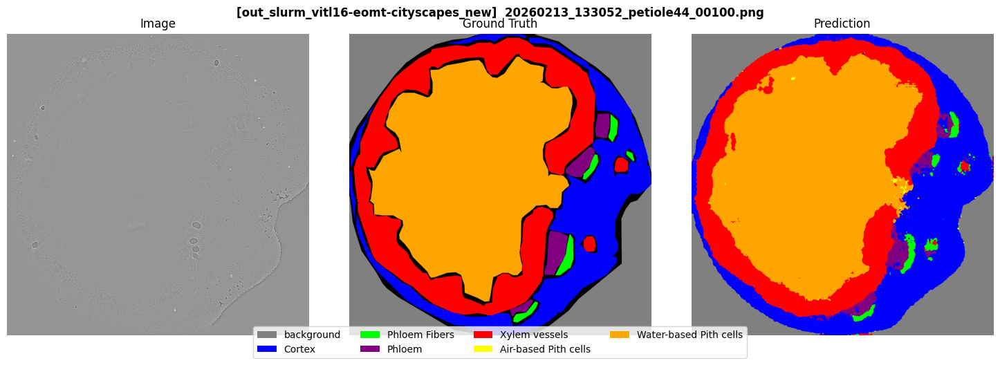

  Batch 3/3 done
<<< Done → dino_results/out_slurm_vitl16-eomt-cityscapes_new

✓ All checkpoints processed.


In [2]:
import lightly_train
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.nn.functional as F

# ------------------------
# Class definitions
# ------------------------
CLASS_COLORS = {
    0: [128,128,128], 1: [0,0,255],   2: [0,255,0],
    3: [128,0,128],   4: [255,0,0],   5: [255,255,0],
    6: [255,165,0],
}
CLASS_NAMES = {
    0: "background",      1: "Cortex",          2: "Phloem Fibers",
    3: "Phloem",          4: "Xylem vessels",   5: "Air-based Pith cells",
    6: "Water-based Pith cells",
}
IGNORE_CLASSES = [255]

def mask_to_color(mask_array):
    h, w = mask_array.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for class_id, color in CLASS_COLORS.items():
        color_mask[mask_array == class_id] = color
    return color_mask

# ------------------------
# Dataset
# ------------------------
class ImageMaskDataset(Dataset):
    def __init__(self, img_dir, mask_dir):
        self.img_dir  = Path(img_dir)
        self.mask_dir = Path(mask_dir)
        IMG_EXTS = {".png", ".jpg", ".jpeg", ".tif", ".tiff"}
        self.img_paths = sorted([
            p for p in self.img_dir.iterdir() if p.suffix.lower() in IMG_EXTS
        ])
        self.img_paths = [p for p in self.img_paths if (self.mask_dir / p.name).exists()]

    def __len__(self): return len(self.img_paths)

    def __getitem__(self, idx):
        img_path  = self.img_paths[idx]
        img       = Image.open(img_path).convert("RGB")
        return {
            'image':    transforms.ToTensor()(img),
            'image_np': np.array(img),
            'gt_mask':  np.array(Image.open(self.mask_dir / img_path.name)),
            'img_name': img_path.name
        }

# ------------------------
# Prediction
# ------------------------
def predict_batch(model, batch_images):
    if model.training: model.eval()
    device, pred_masks = next(model.parameters()).device, []
    for i in range(batch_images.shape[0]):
        x = batch_images[i]
        h, w = x.shape[-2:]
        if x.dtype != torch.float32: x = x.float()
        x = transforms.functional.normalize(x, mean=model.image_normalize["mean"], std=model.image_normalize["std"])
        x = transforms.functional.resize(x, size=[min(model.image_size)]).unsqueeze(0)
        logits = model._forward_logits(x)[:, :-1]
        logits = F.interpolate(logits, size=(h, w), mode="bilinear")
        masks  = model.internal_class_to_class[logits.argmax(dim=1)]
        pred_masks.append(masks[0].cpu().numpy())
    return pred_masks

# ------------------------
# Paths & config
# ------------------------
IMG_DIR  = Path("/pscratch/sd/x/xchong/lightly/42folders_png/val/images")
MASK_DIR = Path("/pscratch/sd/x/xchong/lightly/42folders_png/val/masks")

CKPT_PATHS = [
    "/pscratch/sd/x/xchong/lightly/out_slurm_vits16-eomt/my_experiment_petiole_42tiff_6classes/checkpoints/best.ckpt",
    "/pscratch/sd/x/xchong/lightly/out_slurm_vitb16-eomt/my_experiment_petiole_42tiff_6classes/checkpoints/best.ckpt",
    "/pscratch/sd/x/xchong/lightly/out_slurm_vitl16/my_experiment_petiole_42tiff_6classes/checkpoints/best.ckpt",
    "/pscratch/sd/x/xchong/lightly/out_slurm_vitl16-eomt-cityscapes_new/my_experiment_petiole_42tiff_6classes/checkpoints/best.ckpt",
]

BATCH_SIZE, NUM_WORKERS = 4, 4

def extract_folder_name(ckpt_path):
    for part in Path(ckpt_path).parts:
        if part.startswith("out_slurm_"): return part
    raise ValueError(f"No 'out_slurm_*' found in: {ckpt_path}")

# ------------------------
# Main
# ------------------------
device     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dataset    = ImageMaskDataset(IMG_DIR, MASK_DIR)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=NUM_WORKERS, pin_memory=True)

print(f"Total images: {len(dataset)} | Batches: {len(dataloader)}")
print("=" * 70)

for ckpt_path in CKPT_PATHS:
    folder_name = extract_folder_name(ckpt_path)
    out_dir     = Path("dino_results") / folder_name
    out_dir.mkdir(parents=True, exist_ok=True)

    print(f"\n>>> {folder_name}")
    model = lightly_train.load_model(ckpt_path)
    model.eval().to(device)

    with torch.inference_mode():
        for batch_idx, batch in enumerate(dataloader):
            pred_masks = predict_batch(model, batch['image'].to(device))

            for i in range(len(batch['img_name'])):
                img_np       = batch['image_np'][i]
                gt_mask_np   = batch['gt_mask'][i]
                pred_mask_np = pred_masks[i]
                img_name     = batch['img_name'][i]

                if isinstance(img_np,     torch.Tensor): img_np     = img_np.cpu().numpy()
                if isinstance(gt_mask_np, torch.Tensor): gt_mask_np = gt_mask_np.cpu().numpy()

                # Save predicted mask
                Image.fromarray(pred_mask_np.astype(np.uint8)).save(out_dir / img_name)

                # Plot: image | GT mask | predicted mask
                fig, axes = plt.subplots(1, 3, figsize=(15, 5))
                axes[0].imshow(img_np);                   axes[0].set_title("Image")
                axes[1].imshow(mask_to_color(gt_mask_np)); axes[1].set_title("Ground Truth")
                axes[2].imshow(mask_to_color(pred_mask_np)); axes[2].set_title("Prediction")
                for ax in axes: ax.axis("off")

                # Legend
                active = [c for c in np.unique(np.concatenate([np.unique(gt_mask_np), np.unique(pred_mask_np)]))
                          if c not in IGNORE_CLASSES]
                legend_elements = [
                    plt.Rectangle((0,0), 1, 1,
                        fc=np.array(CLASS_COLORS[c])/255.0,
                        label=CLASS_NAMES.get(c, f"Class {c}"))
                    for c in sorted(active) if c in CLASS_COLORS
                ]
                if legend_elements:
                    fig.legend(handles=legend_elements, loc='lower center',
                               ncol=min(4, len(legend_elements)), bbox_to_anchor=(0.5, -0.05))

                plt.suptitle(f"[{folder_name}]  {img_name}", fontsize=12, fontweight='bold')
                plt.tight_layout()
                plt.show()

            print(f"  Batch {batch_idx+1}/{len(dataloader)} done")

    print(f"<<< Done → {out_dir}")
    del model
    torch.cuda.empty_cache()

print("\n✓ All checkpoints processed.")